In [45]:
#from google.colab import drive
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import plotly.express as px
from sklearn.model_selection import KFold
from tensorflow.keras import layers, regularizers


#drive.mount('/content/drive')

# Seminar 4 - Neural Networks

Javier González Otero - 243078

Jordi Guillén González - 253027

David Sánchez Maldonado - 253798

## Part 1 - Data Preparation & analysis

In [3]:
train_data = pd.read_csv("data/train_data.csv")
test_data = pd.read_csv("data/test_data.csv")

### Dataset Visualization and cleaning

In [14]:
# Check for missing, NaNs, or non valid values
def check_missing_values(df):
    return pd.DataFrame({
        "null_or_nan": df.isnull().sum(),
        "empty_strings": (df.astype(str).apply(lambda x: x.str.strip()) == '').sum(),
        "total_missing": df.map(lambda x: pd.isnull(x) or (isinstance(x, str) and x.strip() == "")).sum()
    })

In [15]:
check_missing_values(train_data)

,null_or_nan,empty_strings,total_missing
LocationNumber,0,0,0
RSSI,0,0,0
TxLinkSpeed,0,0,0
RxLinkSpeed,0,0,0
MainAPConnect,0,0,0
TxThroughput,0,0,0
AvgPingLatency,0,0,0


In [16]:
check_missing_values(test_data)

,null_or_nan,empty_strings,total_missing
LocationNumber,0,0,0
RSSI,0,0,0
TxLinkSpeed,0,0,0
RxLinkSpeed,0,0,0
MainAPConnect,0,0,0
TxThroughput,0,0,0
AvgPingLatency,0,0,0


No cleaning is needed, everything looks usable!

In [17]:
train_data.head()

,LocationNumber,RSSI,TxLinkSpeed,RxLinkSpeed,MainAPConnect,TxThroughput,AvgPingLatency
0,2,-72.32,163.11,118.36,1,13.51,51.79
1,32,-73.18,238.45,212.83,1,3.35,68.80
2,20,-40.67,865.44,863.39,1,17.62,50.79
3,10,-60.66,473.89,396.92,1,14.30,64.15
4,29,-67.96,479.74,355.99,1,4.81,73.81


### Statistics

In [18]:
train_data.describe()

,LocationNumber,RSSI,TxLinkSpeed,RxLinkSpeed,MainAPConnect,TxThroughput,AvgPingLatency
count,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000
mean,18.151161,-62.364212,491.264874,460.954107,0.913958,12.988920,54.771372
std,10.338002,9.442463,240.868700,251.600115,0.280430,4.413973,8.735672
min,1.000000,-79.040000,33.240000,-12.530000,0.000000,0.780000,39.300000
25%,9.000000,-70.360000,273.200000,249.127500,1.000000,11.320000,48.940000
50%,18.000000,-62.910000,476.635000,396.480000,1.000000,14.790000,52.290000
75%,27.000000,-53.790000,664.390000,656.422500,1.000000,15.980000,57.470000
max,36.000000,-37.020000,905.390000,911.000000,1.000000,19.160000,96.550000


In [13]:
test_data.describe()

,LocationNumber,RSSI,TxLinkSpeed,RxLinkSpeed,MainAPConnect,TxThroughput,AvgPingLatency
count,8400.000000,8400.000000,8400.000000,8400.000000,8400.000000,8400.000000,8400.000000
mean,18.252500,-62.392752,490.784789,460.786707,0.910833,12.904876,54.679929
std,10.396517,9.574595,242.528150,253.640807,0.285001,4.436742,8.745980
min,1.000000,-78.680000,45.640000,-24.270000,0.000000,1.030000,39.320000
25%,9.000000,-70.620000,264.327500,248.700000,1.000000,11.140000,48.910000
50%,18.000000,-62.980000,475.230000,396.785000,1.000000,14.710000,52.270000
75%,27.000000,-53.600000,666.142500,658.340000,1.000000,15.930000,57.375000
max,36.000000,-37.270000,904.920000,907.340000,1.000000,19.110000,96.430000


### Compare data distributions

In [19]:
data_df = pd.concat([train_data, test_data], ignore_index=True)

In [35]:
continuous_variables = ['RSSI', 'TxLinkSpeed', 'RxLinkSpeed', 'TxThroughput', 'AvgPingLatency']
discrete_variables = ['LocationNumber', 'MainAPConnect']

#### Visualize distribution of variables without normalization

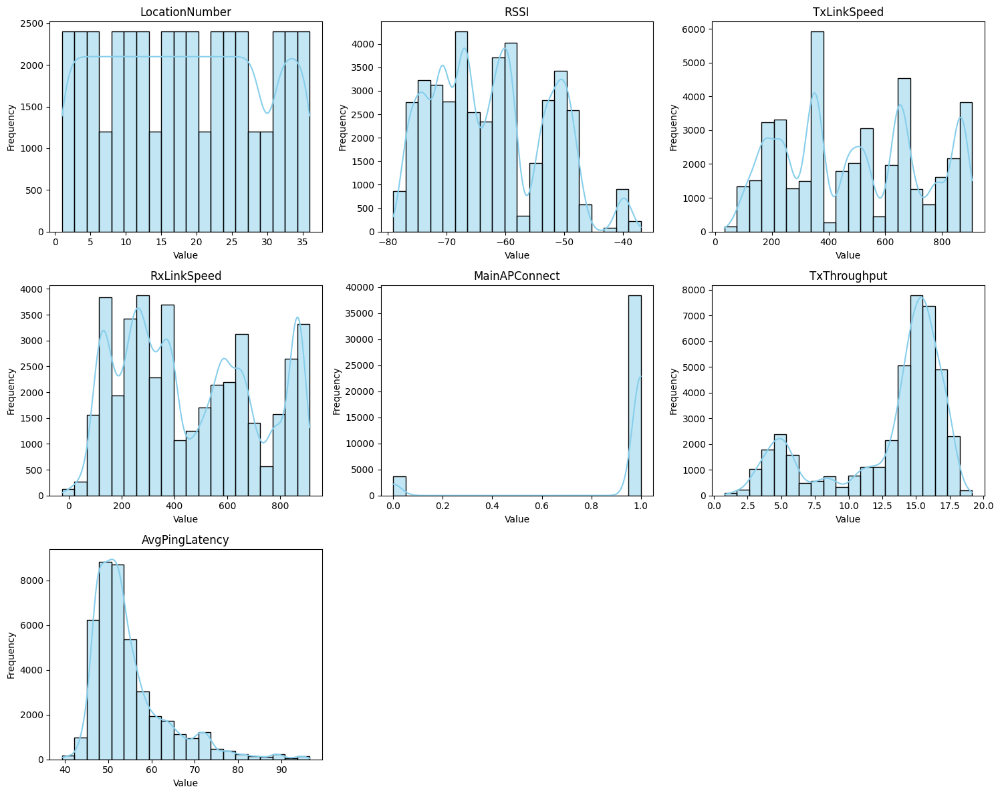

In [21]:
# Columns to plot
columns_to_plot = data_df.columns.tolist()

# Create figure and axes
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 12))
axes = axes.flatten()

# Plot histogram + KDE
for i, col in enumerate(columns_to_plot):
    sns.histplot(data_df[col], bins=20, kde=True, ax=axes[i], color='skyblue', edgecolor='black')
    axes[i].set_title(col)
    axes[i].set_xlabel("Value")
    axes[i].set_ylabel("Frequency")

# Hide any unused axes
for j in range(len(columns_to_plot), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

#### Compare the distribution of continuous variables with target variables (Normalized)

In [23]:
# Initialize the StandardScaler
scaler = StandardScaler()

# Apply standardization to the entire DataFrame
standardized_data = scaler.fit_transform(data_df)

# Convert the result back to a pandas DataFrame with the original column names
standardized_df = pd.DataFrame(standardized_data, columns=data_df.columns)

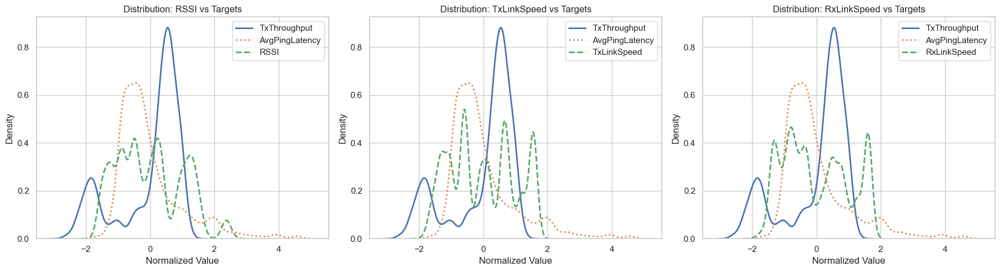

In [25]:
# Set plot style for better aesthetics
sns.set(style="whitegrid")

# Define the two target variables
target_vars = ['TxThroughput', 'AvgPingLatency']

# Select only 3 variables to plot (you can adjust this as needed)
selected_variables = continuous_variables[:3]

# Create a 1x3 subplot grid
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 5))

# Loop over the selected continuous variables
for i, variable in enumerate(selected_variables):
    ax = axes[i]

    # Plot KDE for the first target variable (solid line)
    sns.kdeplot(data=standardized_df, x=target_vars[0], label=target_vars[0], ax=ax, linewidth=2)

    # Plot KDE for the second target variable (dotted line)
    sns.kdeplot(data=standardized_df, x=target_vars[1], label=target_vars[1], ax=ax, linewidth=2, linestyle=":")

    # Plot KDE for the current continuous variable (dashed line)
    sns.kdeplot(data=standardized_df, x=variable, label=variable, ax=ax, linestyle="--", linewidth=2)

    # Set title and labels
    ax.set_title(f'Distribution: {variable} vs Targets', fontsize=12)
    ax.set_xlabel("Normalized Value")
    ax.set_ylabel("Density")
    ax.legend()

# Adjust layout to avoid overlap
plt.tight_layout()
plt.show()

#### Compare the distribution of discrete variables with target variables (Not Normalized for better visualization)

In [33]:
# List of discrete variables
discrete_variables = ['LocationNumber', 'MainAPConnect']

# Target variables
target_vars = ['TxThroughput', 'AvgPingLatency']

# Create one interactive plot per discrete variable
for var in discrete_variables:
    # Melt the dataframe to long format for plotly
    melted_df = data_df.melt(id_vars=[var], value_vars=target_vars,
                               var_name='Target', value_name='Value')

    fig = px.box(melted_df, x=var, y='Value', color='Target',
                 title=f'Distribution of Targets by {var}',
                 labels={'Value': 'Value', var: var},
                 width=900, height=500,
                 points='outliers')  # Optional: show individual points

    fig.update_layout(boxmode='group')  # Group boxes by discrete variable
    fig.show()

It seems that Location Number affects both TxThroughput and AvgPingLatency, hence, it is important to include it in the final model.

MainAPConnect presents a substantial variability of distributions for TxThroughput, therefore, it is necessary to include it as a predictor for TxThroughput. However, the distribution of AvgPingLatency does not present any substantial change between values of MainAPConnect, therefore it could probably introduce noise for predicting the value of AvgPingLatency, then it gets discarded to predict AvgPingLatency.

### Correlation between continuous variables (MainAPConnect is also included since it has numerical significance)

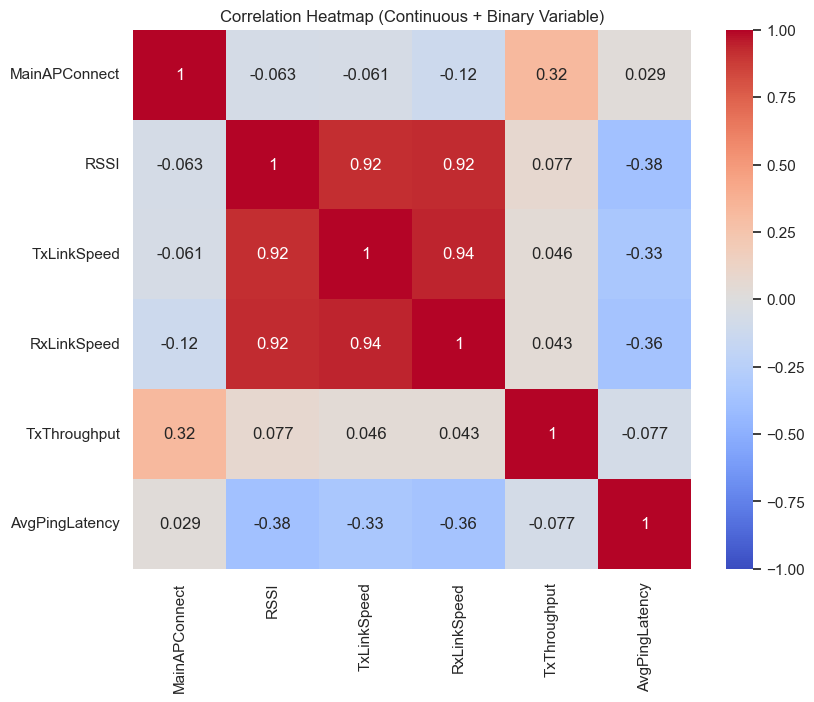

In [39]:
# Include 'MainAPConnect' (binary variable) in the correlation analysis
correlation_matrix = data_df[['MainAPConnect'] + continuous_variables].corr()

# Plot the correlation heatmap
plt.figure(figsize=(9, 7))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Correlation Heatmap (Continuous + Binary Variable)")
plt.show()

The Pearson correlation heatmap shows that the most linearly correlated variable to target ones is MainAPConnect. There is a lot of colinearity between RSSI, TxLinkSpeed and RxLinkSpeed, hence, introducing all three variables to the model could lead to some undesired noise.

## Part 2: FNN-based performance predictor

We will develop two separate models, one for each target variable.
The reason to take this approach is that we believe the results will improve if each model focuses on predicting a single variable, rather than both simultaneously. This reduces the complexity of the learning task, as there are fewer interactions and dependencies for the model to capture.

### Data Preparation

As we will develop two models and data preparation is the same for both, this step will be done prior to feature selection.

The only necessary step to prepare the data is normalization. We have already done this step before to compare distributions of continuous variables. We have the normalized dataframe in standardized_df. However, we need to separate training and test data from the normalized dataframe.

In [40]:
# Determine the original sizes of the train and test sets
n_train = len(train_data)
n_test = len(test_data)

# Split the standardized DataFrame back into train and test
normalized_train_df = standardized_df.iloc[:n_train].reset_index(drop=True)
normalized_test_df = standardized_df.iloc[n_train:].reset_index(drop=True)

### TxThroughput

#### Feature selection

Our initial approach is to select the following features: `LocationNumber`, `MainAPConnect`, `RSSI`, and `TxLinkSpeed`.

- **LocationNumber**  
  The distribution of `TxThroughput` varies significantly across different locations, suggesting that `LocationNumber` is a relevant categorical feature for predicting throughput.

- **MainAPConnect**  
  This is the feature most linearly correlated with `TxThroughput`. Additionally, it shows minimal collinearity with the other variables, making it a strong and independent predictor.

- **RSSI**  
  Including at least one continuous feature is essential to allow the model to produce a wide range of outputs. `RSSI` is the most linearly correlated continuous variable with `TxThroughput` and has low collinearity with both `TxLinkSpeed` and `RxLinkSpeed`.

- **TxLinkSpeed**  
  This is the second most correlated feature among the continuous variables and has lower collinearity with `RSSI` compared to `RxLinkSpeed`.

In [41]:
y_throughput = normalized_train_df['TxThroughput']
X_throughput = normalized_train_df.drop(['TxThroughput', 'RxLinkSpeed', 'AvgPingLatency'], axis=1)

#### Architecture design

In [42]:
def create_model(data):
    model = keras.Sequential([
        layers.Dense(128, activation='relu', input_shape=(data.shape[1],),
                     kernel_regularizer=regularizers.l2(0.001)),
        layers.BatchNormalization(),
        layers.Dropout(0.3),
        
        layers.Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
        layers.BatchNormalization(),
        layers.Dropout(0.3),
    
        layers.Dense(32, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
        layers.BatchNormalization(),
        layers.Dropout(0.3),
    
        layers.Dense(1)
    ])
    return model

We use a neural network with three dense layers (128, 64, 32 units) and ReLU activations to model non-linear relationships in the data. Batch normalization and dropout (0.3) are applied to improve training stability and reduce overfitting. L2 regularization helps control model complexity. The output layer has one neuron for regression.

We train the model with the Adam optimizer and MSE loss. Adam allows to progressively adapt the learning rate, and hence it is usually a good choice for training Deep Neural Networks. MSE loss is apropriate for regression tasks. Since it measures the mean squared error it is resiliant to outliers.

#### Training

🔁 Fold 1


C:\Users\jgojg\anaconda3\envs\aprendizaje_redes\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



🔁 Fold 2


KeyboardInterrupt: 

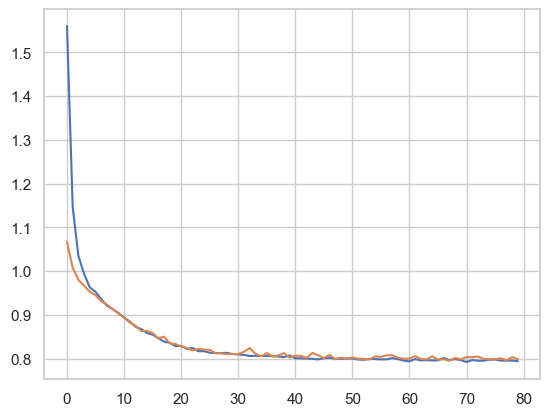

In [46]:
"""
# Define features and target
X = X_throughput.values
y = y_throughput.values

# Number of folds
n_splits = 5

# Training parameters
epochs = 80
batch_size = 128

# Store histories
all_histories = []

# Initialize K-Fold
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

# Cross-validation loop
fold = 1
for train_index, val_index in kf.split(X):
    print(f"🔁 Fold {fold}")

    # Split data into train/validation for this fold
    X_train_fold, X_val_fold = X[train_index], X[val_index]
    y_train_fold, y_val_fold = y[train_index], y[val_index]

    # Create and compile model
    model = create_model(X_train_fold)
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])

    # Train the model
    history = model.fit(X_train_fold, y_train_fold,
                        epochs=epochs,
                        batch_size=batch_size,
                        validation_data=(X_val_fold, y_val_fold),
                        verbose=0)

    # Store history for analysis
    all_histories.append(history.history)

    # Plot loss for this fold
    plt.plot(history.history['loss'], label=f'Train Fold {fold}')
    plt.plot(history.history['val_loss'], label=f'Val Fold {fold}')
    fold += 1

# Final loss plot
plt.title('Training and Validation Loss Across Folds')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()
"""

In [ ]:
feature_columns = X.columns

X_test = test_data[feature_columns]
X_test_scaled = scaler.transform(X_test)

predictions = model.predict(X_test_scaled)
predictions_df = pd.DataFrame(predictions, columns=['Predicted_TxThroughput'])

263/263 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Predicciones generadas a partir del modelo:


In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

real_txthroughput_test = test_data['TxThroughput']

mse_test = mean_squared_error(real_txthroughput_test, predictions)
print(f"Mean Squared Error (MSE) en los datos de prueba: {mse_test}")

mae_test = mean_absolute_error(real_txthroughput_test, predictions)
print(f"Mean Absolute Error (MAE) en los datos de prueba: {mae_test}")

rmse_test = np.sqrt(mse_test)
print(f"Root Mean Squared Error (RMSE) en los datos de prueba: {rmse_test}")

Mean Squared Error (MSE) en los datos de prueba: 12.396265034090888
Mean Absolute Error (MAE) en los datos de prueba: 2.7744819092648365
Root Mean Squared Error (RMSE) en los datos de prueba: 3.5208330028689074
